In [13]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

!pip install seaborn

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./광안대교_앵커리지1_신규.csv'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

plt.style.use(['seaborn-pastel'])        
        
df = pd.read_csv('./광안대교_앵커리지1_신규.csv')

df.rename(columns = {"Unnamed: 0" : "Day"},inplace = True)

df_prophet = df.copy()
df_prophet.dropna(axis=0, subset=['electricPotential'], inplace = True)
df_prophet['electricPotential'] = -1 * df_prophet['electricPotential']
df_prophet.info()
df.info()
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

You should consider upgrading via the '/home/sqeng/venv/bin/python -m pip install --upgrade pip' command.
<class 'pandas.core.frame.DataFrame'>
Int64Index: 9774 entries, 0 to 204241
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dateTime           9774 non-null   object 
 1   temperature        0 non-null      float64
 2   salinity           0 non-null      float64
 3   condolence         0 non-null      float64
 4   electricPotential  9774 non-null   float64
dtypes: float64(4), object(1)
memory usage: 458.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204277 entries, 0 to 204276
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   dateTime           204277 non-null  object 
 1   temperature        185534 non-null  float64
 2   salinity           178093 non-null  float64
 3   condolence         194433 non-null  

In [14]:
df_test = pd.DataFrame()
df = df.set_index(pd.to_datetime(df['dateTime']))

if df['electricPotential'].notnull:
    if df['salinity'].isnull:
        df['salinity'].interpolate(method='bfill', inplace=True)
    if df['condolence'].isnull:
        df['condolence'].interpolate(method='bfill', inplace=True)
    if df['temperature'].isnull:
        df['temperature'].interpolate(method='bfill', inplace=True)
    #df['salinity'].interpolate(method='pad', inplace=True)
    #df['condolence'].interpolate(method='pad', inplace=True)
    #df['temperature'].interpolate(method='pad', inplace=True)

df.dropna(subset=['electricPotential'], inplace = True)
df_test = df
df_test['electricPotential'] = -1 * df['electricPotential']
df_test[['salinity','condolence','temperature']].astype('float64')

df_test = df_test.drop(['dateTime'], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9774 entries, 2020-10-20 11:30:17 to 2021-04-20 11:10:29
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dateTime           9774 non-null   object 
 1   temperature        9774 non-null   float64
 2   salinity           9774 non-null   float64
 3   condolence         9774 non-null   float64
 4   electricPotential  9774 non-null   float64
dtypes: float64(4), object(1)
memory usage: 458.2+ KB


In [15]:
##df['dateTime'].resample('1H').first()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9774 entries, 2020-10-20 11:30:17 to 2021-04-20 11:10:29
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        9774 non-null   float64
 1   salinity           9774 non-null   float64
 2   condolence         9774 non-null   float64
 3   electricPotential  9774 non-null   float64
dtypes: float64(4)
memory usage: 381.8 KB


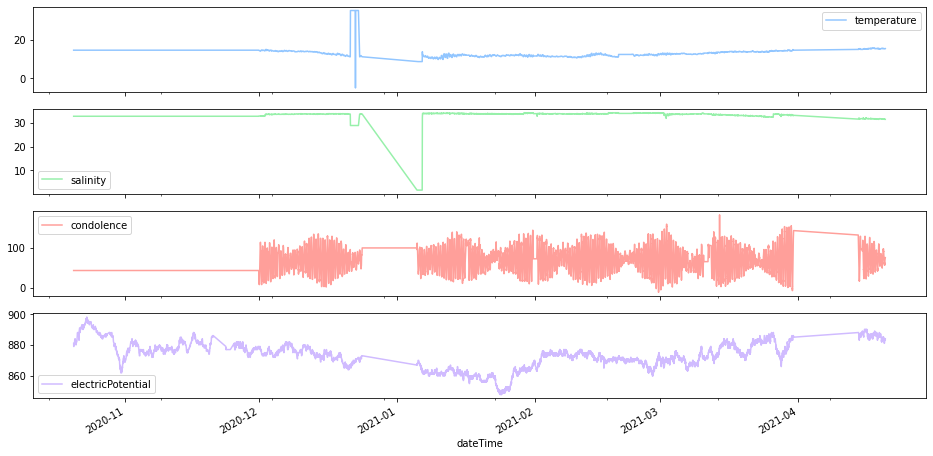

In [16]:
#df_test['dateTime'] = df['dateTime'].resample('1H').first()
#df_test['temperature'] = df['temperature'].resample('1H').first()
#df_test['salinity'] = df['salinity'].resample('1H').first()
#df_test['condolence'] = df['condolence'].resample('1H').first()
#df_test['electricPotential'] =  df['electricPotential'].resample('1H').first()

df_test.info()
df_test.plot(figsize=(16,8), subplots=True)
plt.show()

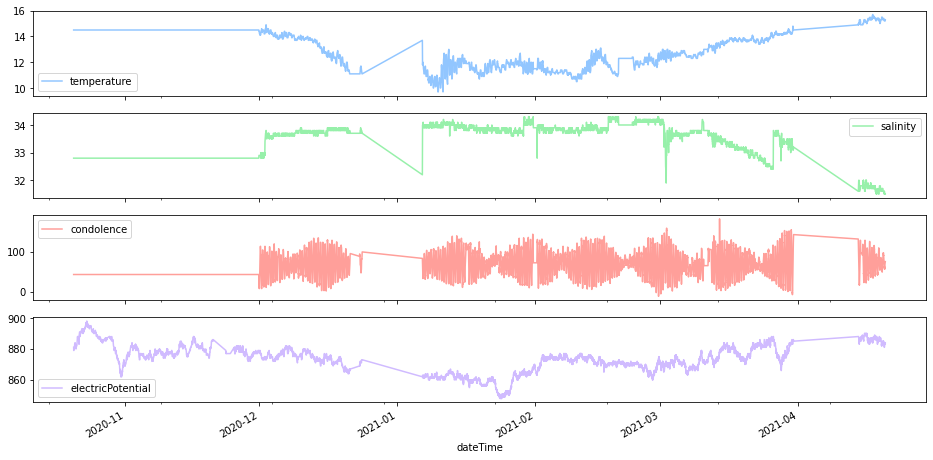

In [17]:
#df_test['salinity'].fillna(method='pad', inplace=True)
#df_test['condolence'].fillna(method='pad', inplace=True)
#df_test['temperature'].fillna(method='pad', inplace=True)
#df_test['electricPotential'].fillna(method='pad', inplace=True)
#df_test['dateTime'].fillna(method='pad', inplace=True)
#df_test['salinity'].fillna(method='bfill', inplace=True)
#df_test['condolence'].fillna(method='bfill', inplace=True)
#df_test['temperature'].fillna(method='bfill', inplace=True)
#df_test['electricPotential'].fillna(method='bfill', inplace=True)


##이상값 처리

quartiles = np.percentile(df_test['salinity'],[25,50,75])
IQR = (quartiles[2]-quartiles[0])
search_df = df_test[(df_test['salinity'] < (quartiles[0] - 1.5 * IQR)) | (df_test['salinity'] > (quartiles[2] + 1.5 * IQR))]
df_test = df_test.drop(search_df.index,axis=0)
quartiles = np.percentile(df_test['temperature'],[25,50,75])
IQR = (quartiles[2]-quartiles[0])
search_df = df_test[(df_test['temperature'] < (quartiles[0] - 1.5 * IQR)) | (df_test['temperature'] > (quartiles[2] + 1.5 * IQR))]
df_test = df_test.drop(search_df.index,axis=0)

df_test2 = df_test.copy()


df_test
df_test2.plot(figsize=(16,8), subplots=True)
plt.show()
#df_test2.info()

[[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]]
0
0
0
1
0
2


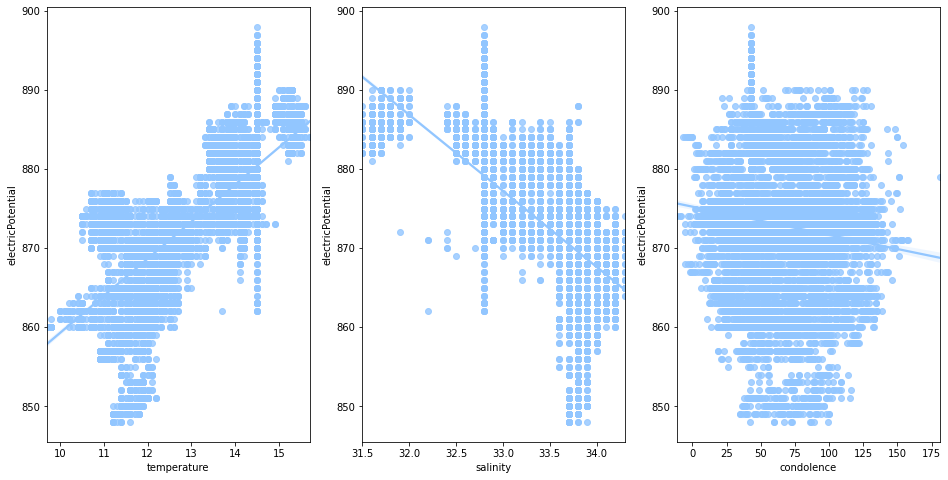

In [7]:
df_test.to_csv("./Busan_Data/Gwangan/GwangAnBridge_1H(for xgboost)")

fig, axs = plt.subplots(figsize=(16,8), ncols=3, nrows=1, squeeze=False)
features = ['temperature', 'salinity', 'condolence']
print(axs)
for i, feature in enumerate(features):
    row = 0
    print(row)
    col = i%4
    print(col)
    sns.regplot(x=feature, y='electricPotential', data=df_test, ax=axs[row][col])

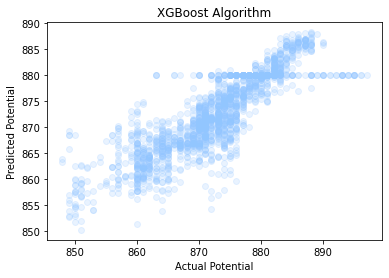

MSE : 18.992, RMSE : 4.358
Variance score : 0.745
DecisionTreeClassifier 정확도: 0.3135
RandomForestClassifier 정확도: 0.3332


In [8]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import xgboost as xgb
df_testq = df_test.astype('float64')
y_data = df_testq['electricPotential']
x_data = df_testq[['salinity','condolence','temperature']]

x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, train_size=0.8, test_size=0.2, random_state=12)

xgb_mod = xgb.XGBRegressor(
   booster='gbtree',
    gamma=10,     
    reg_lambda=10,
    reg_alpha=10,
    min_child_weight=10,
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=3,
    n_estimators=10000,                                                                    
    subsample=0.8,
    random_state=12
    
) 

xgb_mod.fit(x_train, y_train)
xgb_predictions = xgb_mod.predict(x_test)

lr = LinearRegression()
lr.fit(x_train, y_train)
y_preds = lr.predict(x_test)

plt.scatter(y_test, xgb_predictions, alpha=0.2)
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.title("XGBoost Algorithm")
plt.show()

mse = mean_squared_error(y_test, xgb_predictions)
rmse = np.sqrt(mse)

print('MSE : {0:.3F}, RMSE : {1:.3F}'.format(mse,rmse))
print('Variance score : {0:.3f}'.format(r2_score(y_test,xgb_predictions)))

dt_clf = DecisionTreeClassifier(random_state=12)
rf_clf = RandomForestClassifier(random_state=12)
lr_clf = LogisticRegression(solver='lbfgs', max_iter=4000)

dt_clf.fit(x_train, y_train)
dt_pred = dt_clf.predict(x_test)
print('DecisionTreeClassifier 정확도: {0:.4f}'.format(accuracy_score(y_test, dt_pred)))

rf_clf.fit(x_train, y_train)
rf_pred = rf_clf.predict(x_test)
print('RandomForestClassifier 정확도: {0:.4f}'.format(accuracy_score(y_test, rf_pred)))

#LogisticRegression 학습/예측/평가
#lr_clf.fit(x_train, y_train)
#lr_pred = lr_clf.predict(x_test)
#print('LogisticRegression 정확도: {0:.4f}'.format(accuracy_score(y_test, lr_pred)))

In [98]:
from hyperopt import fmin, tpe, hp
from sklearn.model_selection import cross_val_score

#params = {'max_depth': hp.quniform('max_depth', 2, 10, 1),
          #'subsample': hp.uniform('subsample', 0.1, 0.9)}

def objective(params):
    params = {'max_depth': int(params['max_depth']),
              'subsample': params['subsample']}
    xgb_clf = xgb.XGBRegressor(n_estimateors=10000, **params)
    best_score = cross_val_score(xgb_clf, x_train, y_train, scoring='accuracy',cv=5,n_jobs=8).mean()
    loss= 1-best_score
    return loss

#best = fmin(fn=objective, space=params,max_evals=10, rstate=np.random.RandomState(12),algo=tpe.suggest)
#print(best)

In [99]:
df_prophet2 = df_prophet.rename(columns = {'dateTime' :'ds', 'electricPotential' : 'y'})
df_prophet2.to_csv("./Busan_Data/Gwangan//GwangAnBridge_1H(for prophet)")

df_prophet2.head()

,ds,temperature,salinity,condolence,y
0,2020-10-20 11:30:17,NaN,NaN,NaN,881.0
1,2020-10-20 11:35:17,NaN,NaN,NaN,880.0
2,2020-10-20 11:40:18,NaN,NaN,NaN,881.0
3,2020-10-20 11:45:17,NaN,NaN,NaN,880.0
4,2020-10-20 11:53:07,NaN,NaN,NaN,879.0


<AxesSubplot:xlabel='ds'>

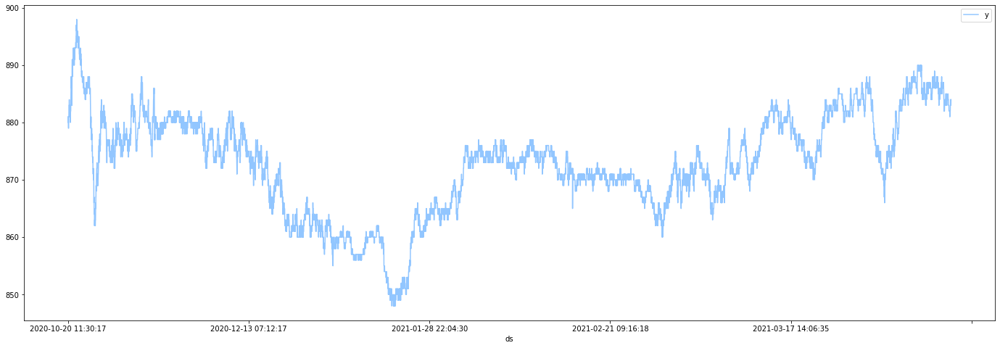

In [100]:
ax = plt.gca()
#df_test2.plot(kind='line', x='ds', y='y', ax=ax,label='electricPotential', figsize=(24,8))

df_prophet2.plot(kind='line', x='ds', y='y', ax=ax, figsize=(24,8))

In [101]:
#df_prophet2.loc[(df_prophet2['ds'] > '2020-12-24') & (df_prophet2['ds'] < '2021-01-05'), 'y'] = None
df_prophet2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9774 entries, 0 to 204241
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ds           9774 non-null   object 
 1   temperature  0 non-null      float64
 2   salinity     0 non-null      float64
 3   condolence   0 non-null      float64
 4   y            9774 non-null   float64
dtypes: float64(4), object(1)
memory usage: 458.2+ KB


In [102]:
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot

df_prophet2['cap'] = 950
df_prophet2['floor'] = 820

model = Prophet(growth='logistic', weekly_seasonality=30,daily_seasonality=10,yearly_seasonality=10, 
                seasonality_mode='additive', seasonality_prior_scale = 3, changepoint_prior_scale=0.1, interval_width=0.95, mcmc_samples=2)
model.add_seasonality(name='monthly', period=30.5, fourier_order=30)

model.fit(df_prophet2, control={'max_treedepth': 10})


To run all diagnostics call pystan.check_hmc_diagnostics(fit)
/home/sqeng/venv/lib/python3.8/site-packages/pystan/diagnostics.py:217: RuntimeWarning:

invalid value encountered in true_divide



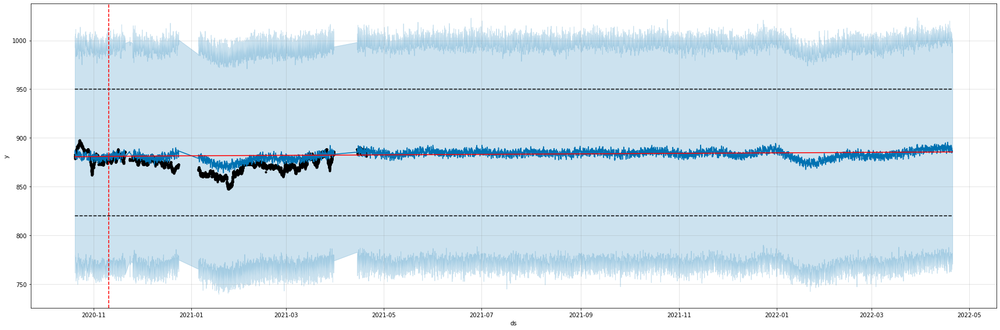

In [67]:
#forecast_t = forecast['ds'].dt.to_pydatetime()
future = model.make_future_dataframe(periods=8760, freq='H')
future['cap'] = 950
future['floor'] = 820
forecast = model.predict(future)
forecast.tail()
fig1 = model.plot(forecast, figsize=(24,8))
changepoint = add_changepoints_to_plot(fig1.gca(), model, forecast)


In [68]:
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model,forecast)

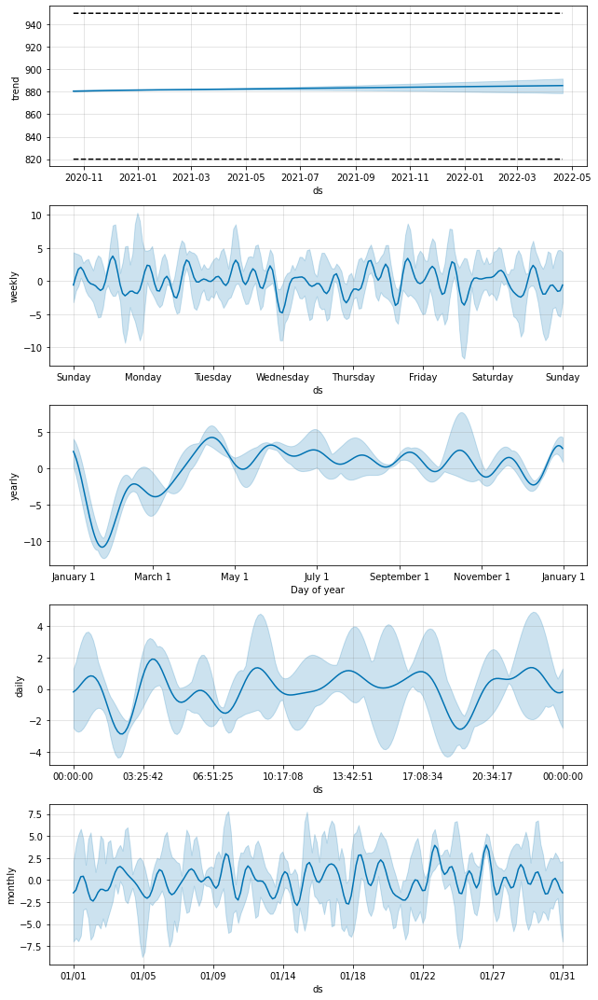

In [69]:
fig2 = model.plot_components(forecast)

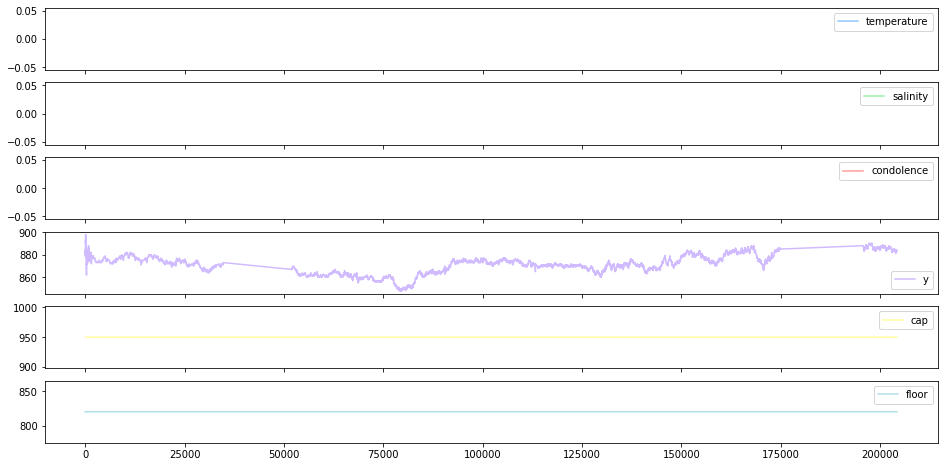

In [70]:
df_prophet2.plot(figsize=(16,8), subplots=True)
plt.show()

In [103]:
def dump(model: fbprophet.Prophet, fn_to_save_model: typing.AnyStr) -> fbprophet.Prophet:
    # Save model by using Pickle
    with open(fn_to_save_model, 'wb') as f:
        pickle.dump(model, f)
    return model

dump(model, "model")

NameError: name 'fbprophet' is not defined